**Analysis of social interactions in the Swiss National Council**


Lucerne University of Applied Sciences\
Master of Science in Applied Information and Data Science

W.MSCIDS_AMS03.H1901: Analysis and Modelling of Social Interactions




**Lecturer:**\
Nicolas Perony: nicolas.perony@oto.ai\
András Vörös: andras.voros@gess.ethz.ch

**Students:**\
Lars Gisler: lars.gisler01@stud.hslu.ch\
Stephana Müller: stephana.mueller@stud.hslu.ch\
Carmela Wey: carmela.wey@stud.hslu.ch

---------------------------------------------------------------------------------------------------------------------

# Intro

The 200 seats in the National Council are allotted to the 26 cantons according to their respective populations (total number of residents = resident population). The population figures are obtained from the registers in the year following the previous election. Each canton is allotted at least one seat (Parlament, 2019).

## Questions
We want to explore the social interactions within the Swiss National Council and answer the following questions:
* Can we identify communities (parties) in the parliament by analyzing how each of the parliamentarian voted?
* Which parliamentarian deviates most from the party line?


## Data

For this project we used data from the Swiss Parliament because:
* the data is very clean
* the data is well structured
* the data is complete and contains a lot of information 

The data contains all votes from 2019 and shows the vote results of each parlamentarian. Furthermore we have additional information like the IDs of the parliamentarian and the political party which is needed to answer our questions.

## Why a network approach is useful?
To see how the parliamentarians behave and if they behave like their fellow party members, building a social network can be very useful. The findings are important for upcoming votes because party members, which deviated in the past a lot from their party line, can be easily targeted by lobbyists. Furthermore the network can be interesting for the parliamentarians because they can see if another member from another party votes for the same political affairs. Finally a network allows discussions amongst the left parties who where detected in the right community and the right parties who where detected in the left community.


## Nodes
The nodes are the 200 parliament members. Each memeber has an ID and is part of a political party.


## Edges (undirected)

The edges of the network can be defined as follows:
* A value between zero and one (weighted interactions between two parliamentarians)
* Fraction of identical votes out of the total number of votes attended together
* Only "Yes" and "No" votes are considered to calculate the weights
* ”Not attended votes" and "abstained votes" are not considered to calculate the weights
* A value close to one indicates that two parliamentarians voted very similar in 2019
* A value close to zero indicates that they rarely voted the same in 2019.




## Sources

Parlament. Retrieved 22.11.2019 from: https://www.parlament.ch/de/ratsbetrieb/abstimmungen/wer-hat-wie-abgestimmt-im-nationalrat


# Data Explanation
Here you see an image of the swiss parliament. This is also our color code for the political parties in the plot outputs further down. There are several parties in the swiss parliament. The image shows the distribution of the seats in the parliament.

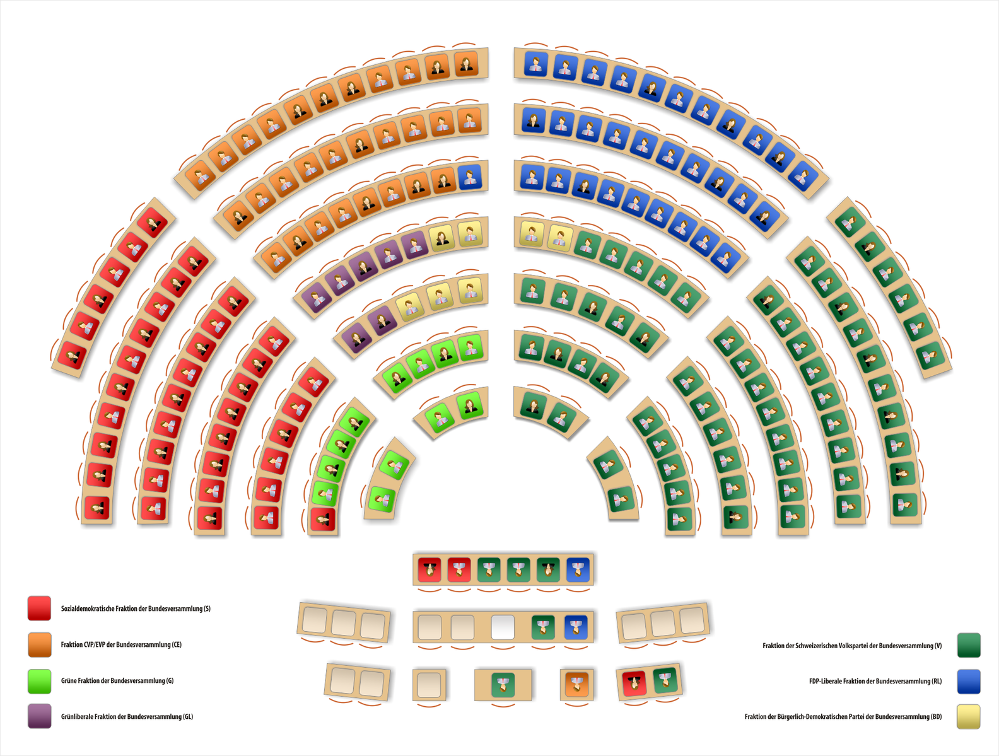
Source: https://de.wikipedia.org/wiki/Datei:Sitzordnung_Nationalrat_nach_Fraktion_2016.12.png

Before we could start to build networks we had to prepare the data which was stored in a csv-file. In the next steps we will explain how we prepared the data, how we created the adjacency matrix and how we finally got to our social network.

# Data Preparation


**Step 3.0: Libraries**
Import the needed libraries to execute the code of the next steps.

In [3]:
#!pip install networkx
import networkx as nx # for networks
import numpy as np # for numpy matrix
import os # provides functions for interacting with the operating system
import matplotlib.pyplot as plt # collection of command style functions that make matplotlib work like MATLAB
import pandas as pd # for all code regarding lists
import scipy # Scipy builds on the NumPy array object & is part of the NumPy stack which includes tools like Matplotlib & pandas
import community # to detect communities


## **Step 3.1: Check and set your working directory**

In [4]:
os.getcwd()

'C:\\Users\\ca_we\\Google Drive\\IDS_AMS_Gruppenarbeit\\Final_Gisler_Müller_Wey'

## **Step 3.2: Create Adjacency Matrix**
An Adjacecy Matrix can now be created from the data. This can be achieved with the following steps.

In [5]:
# load the raw data set
votes = pd.read_csv(r'votes.csv', index_col=0,encoding='latin-1')

In [6]:
# show data set
votes

,3055,2670,2760,2758,2796,3056,2584,3057,3058,2762,...,3044,2715,3125,3100,2728,2759,2638,3127,3101,3102
VoteRegistrationNumber,,,,,,,,,,,,,,,,,,,,,
18160,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,...,Ja,Ja,Ja,Ja,Ja,Ja,Entschuldigt,Ja,Ja,Ja
18162,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,...,Hat nicht teilgenommen,Ja,Ja,Ja,Ja,Ja,Entschuldigt,Ja,Ja,Ja
18163,Nein,Nein,Ja,Nein,Nein,Ja,Nein,Nein,Ja,Ja,...,Ja,Ja,Ja,Ja,Ja,Ja,Entschuldigt,Ja,Nein,Nein
18164,Nein,Nein,Ja,Nein,Nein,Ja,Nein,Nein,Ja,Ja,...,Ja,Ja,Ja,Ja,Ja,Ja,Entschuldigt,Ja,Nein,Nein
18167,Ja,Ja,Nein,Ja,Ja,Ja,Ja,Ja,Nein,Hat nicht teilgenommen,...,Ja,Ja,Nein,Ja,Enthaltung,Nein,Entschuldigt,Nein,Ja,Ja
18168,Ja,Ja,Nein,Ja,Ja,Ja,Ja,Ja,Nein,Nein,...,Ja,Ja,Nein,Ja,Ja,Nein,Entschuldigt,Hat nicht teilgenommen,Ja,Ja
18170,Ja,Ja,Nein,Ja,Ja,Ja,Ja,Ja,Nein,Nein,...,Ja,Ja,Nein,Ja,Nein,Nein,Entschuldigt,Nein,Ja,Ja
18172,Ja,Ja,Nein,Ja,Ja,Ja,Ja,Ja,Nein,Nein,...,Ja,Ja,Nein,Ja,Nein,Hat nicht teilgenommen,Entschuldigt,Nein,Ja,Ja
18173,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,Ja,...,Ja,Ja,Ja,Ja,Ja,Hat nicht teilgenommen,Entschuldigt,Ja,Ja,Nein


## **Step 3.3: Check length and width and remove duplicates**
We also want to inspect the length and width of our dataframe as follows:

In [7]:
# inspect dimensions of the data set
print(len(votes.index))
print(len(votes.columns))

921
200


In [8]:
# there are some duplicates in the dataset that need to be removed
votes = votes.loc[~votes.index.duplicated(keep='first')]
print(len(votes.index)) # 14 duplicates (=votes) removed
print(len(votes.columns))

907
200


## **Step 3.4: Create empty matrix**
To store the data of the adjacency matrix we first have to build an empty matrix.


In [9]:
# create empty matrix with list comprehension
matrix = [[0 for element in range(0,len(votes.columns))] for element in range(0,len(votes.columns))]

# create a data frame from the empty matrix
adj_matrix = pd.DataFrame(matrix, index=votes.columns, columns=votes.columns)

In [10]:
# inspect empty matrix
adj_matrix

,3055,2670,2760,2758,2796,3056,2584,3057,3058,2762,...,3044,2715,3125,3100,2728,2759,2638,3127,3101,3102
3055,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2670,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2760,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2758,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2796,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3056,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2584,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3057,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3058,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2762,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## **Step 3.5: Create the adjacency matrix**
You do not need to execute the next three cells. This cells were needed to create the adjacency matrix. We already did this and stored the matrix into the folder you got as a csv-file. Also for the presentation this step would be too time-consuming. That is why we changed it to a "RAW" element. If you want to execute the code, simply change the element to "code" and execute it again.

The following code was just to test the concept of iterating through all parliamentarians and votes.

## **Step 3.6: Save the calculated adjacency matrix**
Also here, change the element from "RAW" to "code" to execute the code.

## **Step 3.7: Read adjacency matrix from your directory**

In [11]:
# read adjacency matrix from the directory where the file is stored
df = pd.read_csv(r'adjacency_matrix.csv', index_col=0)
df # inspect the matrix

,3055,2670,2760,2758,2796,3056,2584,3057,3058,2762,...,3044,2715,3125,3100,2728,2759,2638,3127,3101,3102
3055,1.000000,0.946650,0.246212,0.918246,0.936629,0.646707,0.936010,0.949054,0.246988,0.253989,...,0.666216,0.441250,0.445980,0.550181,0.362069,0.652447,0.539310,0.694226,0.913349,0.932642
2670,0.946650,1.000000,0.235741,0.936068,0.952746,0.652812,0.956688,0.976574,0.235653,0.236388,...,0.688187,0.444020,0.442602,0.549383,0.350336,0.646465,0.545455,0.686667,0.944114,0.941799
2760,0.246212,0.235741,1.000000,0.180368,0.203145,0.519207,0.203390,0.226048,0.955720,0.987919,...,0.457815,0.742931,0.747423,0.616834,0.832196,0.535897,0.672753,0.502019,0.198307,0.222841
2758,0.918246,0.936068,0.180368,1.000000,0.969136,0.614936,0.977968,0.963121,0.179367,0.185567,...,0.676316,0.400243,0.401961,0.517689,0.314433,0.635810,0.526810,0.684547,0.963512,0.925450
2796,0.936629,0.952746,0.203145,0.969136,1.000000,0.633085,0.977778,0.964339,0.200250,0.208791,...,0.685007,0.438231,0.408322,0.555276,0.335142,0.622396,0.559829,0.667123,0.961259,0.927835
3056,0.646707,0.652812,0.519207,0.614936,0.633085,1.000000,0.625307,0.623209,0.495858,0.512258,...,0.791005,0.647491,0.658867,0.771700,0.618490,0.538745,0.633784,0.555841,0.627586,0.676240
2584,0.936010,0.956688,0.203390,0.977968,0.977778,0.625307,1.000000,0.972644,0.204715,0.211382,...,0.680168,0.416559,0.424904,0.529851,0.326146,0.649936,0.553041,0.692722,0.962696,0.940860
3057,0.949054,0.976574,0.226048,0.963121,0.964339,0.623209,0.972644,1.000000,0.220947,0.236884,...,0.694153,0.415340,0.460606,0.504348,0.353218,0.705706,0.480801,0.731118,0.963788,0.963768
3058,0.246988,0.235653,0.955720,0.179367,0.200250,0.495858,0.204715,0.220947,1.000000,0.956072,...,0.427807,0.726716,0.715517,0.591885,0.811765,0.518473,0.654521,0.483333,0.200924,0.238606
2762,0.253989,0.236388,0.987919,0.185567,0.208791,0.512258,0.211382,0.236884,0.956072,1.000000,...,0.461087,0.741633,0.752381,0.612648,0.831909,0.558389,0.661314,0.522535,0.207858,0.225989


Testing with the next lines of code if we can plot network components with our created adjacency matrix. 

C:\Users\ca_we\Anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


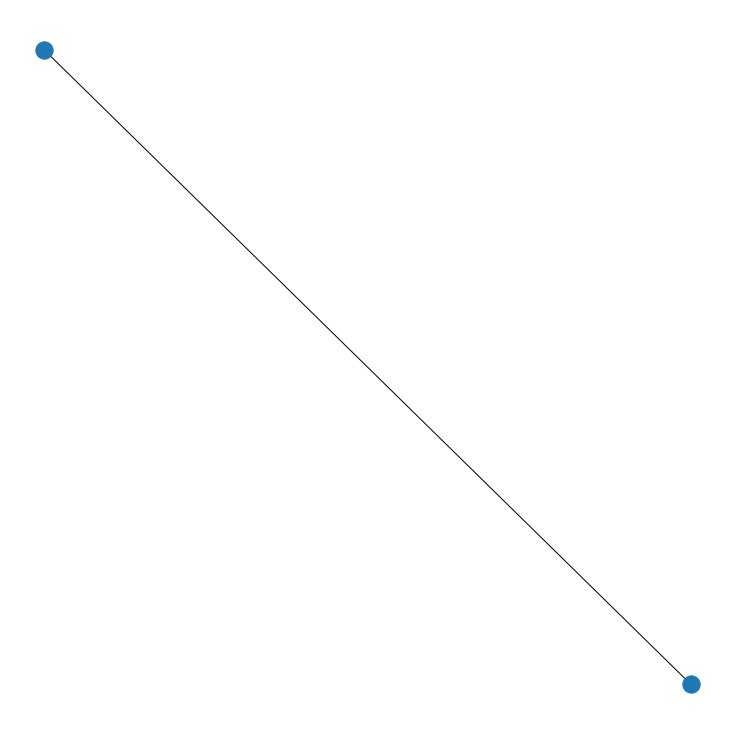

In [12]:
A=np.matrix([[1,1],[2,1]])
G=nx.from_numpy_matrix(A) # create network from a numpy matrix

coords = nx.spring_layout(G)
# Initial positions for nodes as a dictionary with node as keys and values as a coordinate list or tuple. 

plt.figure(figsize=(10,10)) # size of the network plot
nx.draw(G, pos = coords) # drawing the network

## **Step 3.8: Create numpy matrix**

In [13]:
A=np.matrix(df) # convert data frame to numpy matrix

# inspect and print numpy matrix
print(len(A))
print(type(A))
print(A)

200
<class 'numpy.matrix'>
[[1.         0.94665012 0.24621212 ... 0.69422572 0.91334895 0.93264249]
 [0.94665012 1.         0.23574144 ... 0.68666667 0.94411415 0.94179894]
 [0.24621212 0.23574144 1.         ... 0.50201884 0.19830713 0.22284123]
 ...
 [0.69422572 0.68666667 0.50201884 ... 1.         0.66833542 0.27303754]
 [0.91334895 0.94411415 0.19830713 ... 0.66833542 1.         0.91836735]
 [0.93264249 0.94179894 0.22284123 ... 0.27303754 0.91836735 1.        ]]


## **Step 3.9: Create network from numpy matrix**

In [14]:
G=nx.from_numpy_matrix(A)

## Step 3.10: Create first network plot

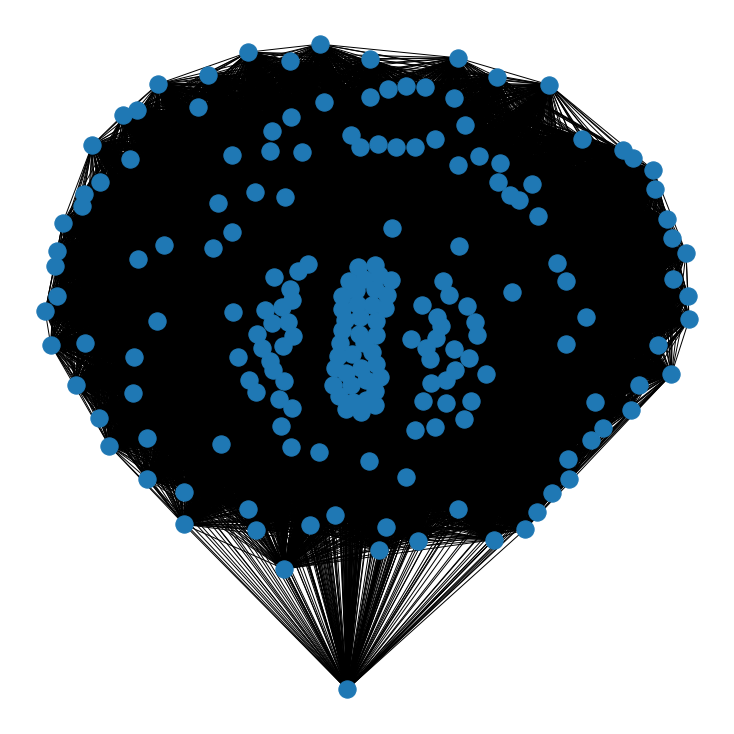

In [15]:
coords = nx.kamada_kawai_layout(G) # using kamada kawai layout
#coords = nx.spring_layout(G)

plt.figure(figsize=(10,10)) # size of network
nx.draw(G, pos=coords) # drawing network

Now you can check the nodes and edges of this first network.

In [16]:
G.nodes() # accessing nodes of the network

NodeView((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199))

In [17]:
G.edges() # accessing edges of the network

EdgeView([(0, 0), (0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 28), (0, 29), (0, 30), (0, 31), (0, 32), (0, 33), (0, 34), (0, 35), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 42), (0, 43), (0, 44), (0, 45), (0, 46), (0, 47), (0, 48), (0, 49), (0, 50), (0, 51), (0, 52), (0, 53), (0, 54), (0, 55), (0, 56), (0, 57), (0, 58), (0, 59), (0, 60), (0, 61), (0, 62), (0, 63), (0, 64), (0, 65), (0, 66), (0, 67), (0, 68), (0, 69), (0, 70), (0, 71), (0, 72), (0, 73), (0, 74), (0, 75), (0, 76), (0, 77), (0, 78), (0, 79), (0, 80), (0, 81), (0, 82), (0, 83), (0, 84), (0, 85), (0, 86), (0, 87), (0, 88), (0, 89), (0, 90), (0, 91), (0, 92), (0, 93), (0, 94), (0, 95), (0, 96), (0, 97), (0, 98), (0, 99), (0, 100), (0, 101), (0, 102), (0, 103), (0, 104), (0, 105), (0, 106), (0, 107), (0, 108), (0, 109), 

With this command you will get an overview of the created network.

In [18]:
print(nx.info(G)) # getting information of the network

Name: 
Type: Graph
Number of nodes: 200
Number of edges: 20100
Average degree: 201.0000


With the get_edge_data command you can retrieve the weighted interactions of two specific nodes (parliament members).

In [19]:
G.get_edge_data(1,1) # here we retrieve the interaction of the parliamentarian 1 with itself.
# The interaction with oneself must always give one. This is the diagonal line in the adjacency matrix.

{'weight': 1.0}

# Building Social Networks
Now we plot the whole network. First we have to define the layouts for the plot. We decided to use the following two layout algorithms:
- spring layout
- kamada kawai layout

In [20]:
coords_spring = nx.spring_layout(G) # defining spring layout
coords_kamada = nx.kamada_kawai_layout(G) # defining kamada kawai layout

## Step 4.0: Kamada Kawai Layout

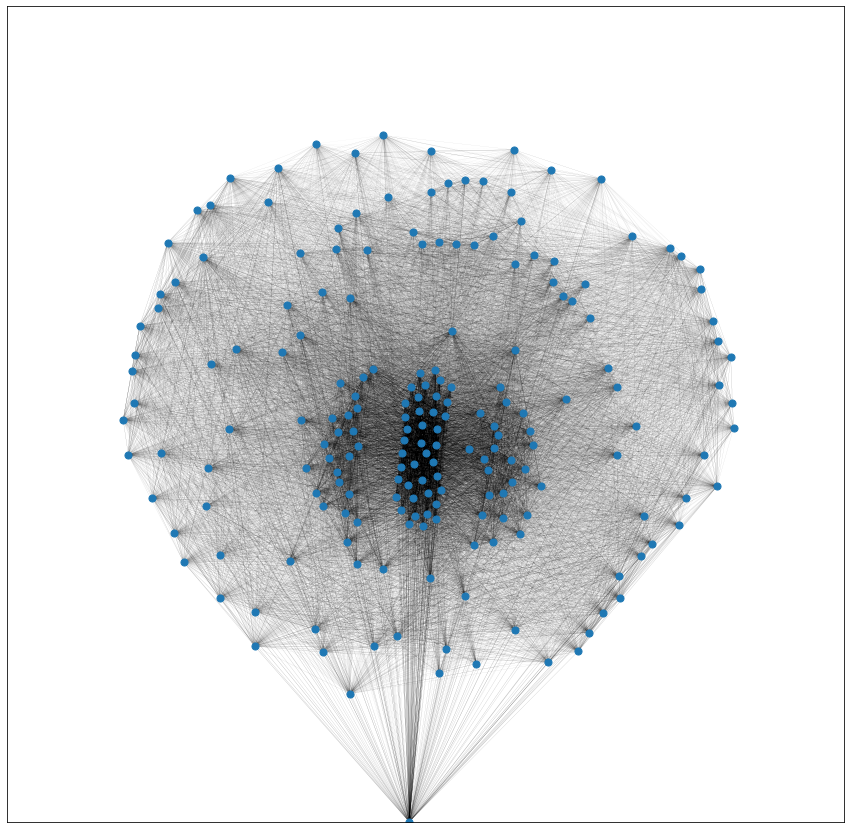

In [21]:
plt.figure(figsize=(15,15)) # define figure size
plt.ylim((-1,1)) # define y-axis
plt.xlim((-1,1)) # define x-axis
nx.draw_networkx_nodes(G, pos=coords_kamada,node_size=50) # draw network nodes
for edge in G.edges(data=True): # draw all network edges with correct weight
    edge_list = [edge[0:2]] # get edges in correct format
    edge_weight = ((edge[2]['weight'])**5)/10 # get weight that allows a readable plot
    nx.draw_networkx_edges(G, edgelist=edge_list, pos=coords_kamada, width=edge_weight)

### Findings with Kamada Kawai Layout

* It is rather difficult to interpret something from the Kamada-Layout.
* There are a lot of interactions between the parliamentarians.
* There is a dark cluster in the middle which is very connected to each other.
* There is one person at the very bottom which looks like an outsider.

## Step 4.1: Spring Layout

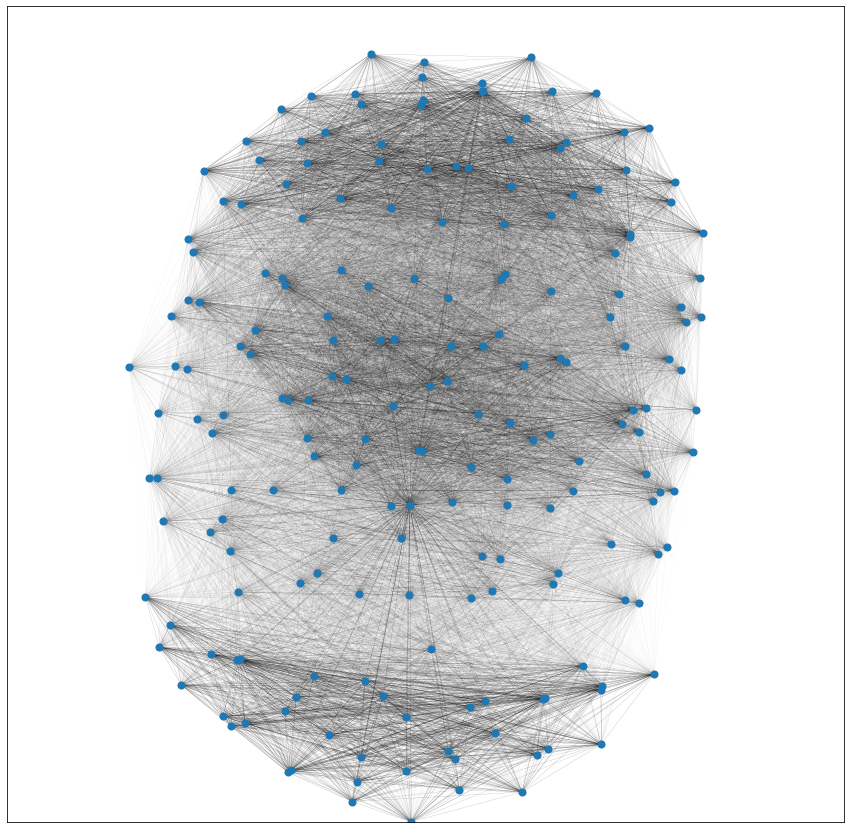

In [22]:
plt.figure(figsize=(15,15)) # define figure size
plt.ylim((-1,1)) # define y-axis
plt.xlim((-1,1)) # define x-axis
nx.draw_networkx_nodes(G, pos=coords_spring,node_size=50)  # draw network nodes
for edge in G.edges(data=True): # draw all network edges with correct weight
    edge_list = [edge[0:2]] # get edges in correct format
    edge_weight = ((edge[2]['weight']+0.3)**6)/50 # get weight that allows a readable plot
    nx.draw_networkx_edges(G, edgelist=edge_list, pos=coords_spring, width=edge_weight)

### Findings with Spring Layout

- After adjusting the weights, some groups can already be identified.
- There seems to be a group on the left, a group in the middle and a group on the right. 
- The middle group seems closer associated to the right group than to the left group. This already sounds a bit like the swiss parliament.
- There are a lot of interactions. Every parliamentarian voted at least a few times with every other parliamentarian.


## **Step 4.2: Community Detection**
We also want to apply the community detection algorithm within this data set. And of course plot the communities (political parties) with different colours. 

In [23]:
# apply community detection algorithm
comm = community.best_partition(G)
comm

{0: 0,
 1: 0,
 2: 1,
 3: 0,
 4: 0,
 5: 2,
 6: 0,
 7: 0,
 8: 1,
 9: 1,
 10: 2,
 11: 1,
 12: 2,
 13: 1,
 14: 2,
 15: 1,
 16: 1,
 17: 0,
 18: 1,
 19: 2,
 20: 2,
 21: 0,
 22: 2,
 23: 1,
 24: 2,
 25: 0,
 26: 0,
 27: 0,
 28: 2,
 29: 0,
 30: 2,
 31: 2,
 32: 2,
 33: 1,
 34: 2,
 35: 1,
 36: 0,
 37: 0,
 38: 1,
 39: 2,
 40: 0,
 41: 1,
 42: 2,
 43: 0,
 44: 2,
 45: 0,
 46: 2,
 47: 0,
 48: 2,
 49: 0,
 50: 2,
 51: 1,
 52: 1,
 53: 1,
 54: 1,
 55: 1,
 56: 0,
 57: 0,
 58: 0,
 59: 1,
 60: 1,
 61: 1,
 62: 0,
 63: 0,
 64: 0,
 65: 1,
 66: 1,
 67: 0,
 68: 1,
 69: 0,
 70: 0,
 71: 2,
 72: 0,
 73: 0,
 74: 1,
 75: 1,
 76: 0,
 77: 1,
 78: 2,
 79: 0,
 80: 0,
 81: 1,
 82: 1,
 83: 0,
 84: 1,
 85: 0,
 86: 1,
 87: 1,
 88: 0,
 89: 0,
 90: 1,
 91: 0,
 92: 0,
 93: 2,
 94: 2,
 95: 2,
 96: 0,
 97: 0,
 98: 1,
 99: 2,
 100: 1,
 101: 0,
 102: 0,
 103: 1,
 104: 0,
 105: 0,
 106: 2,
 107: 2,
 108: 2,
 109: 2,
 110: 1,
 111: 2,
 112: 2,
 113: 1,
 114: 1,
 115: 1,
 116: 0,
 117: 1,
 118: 0,
 119: 1,
 120: 2,
 121: 1,
 122: 1,
 12

### Community Detection with Kamada Kawai Layout

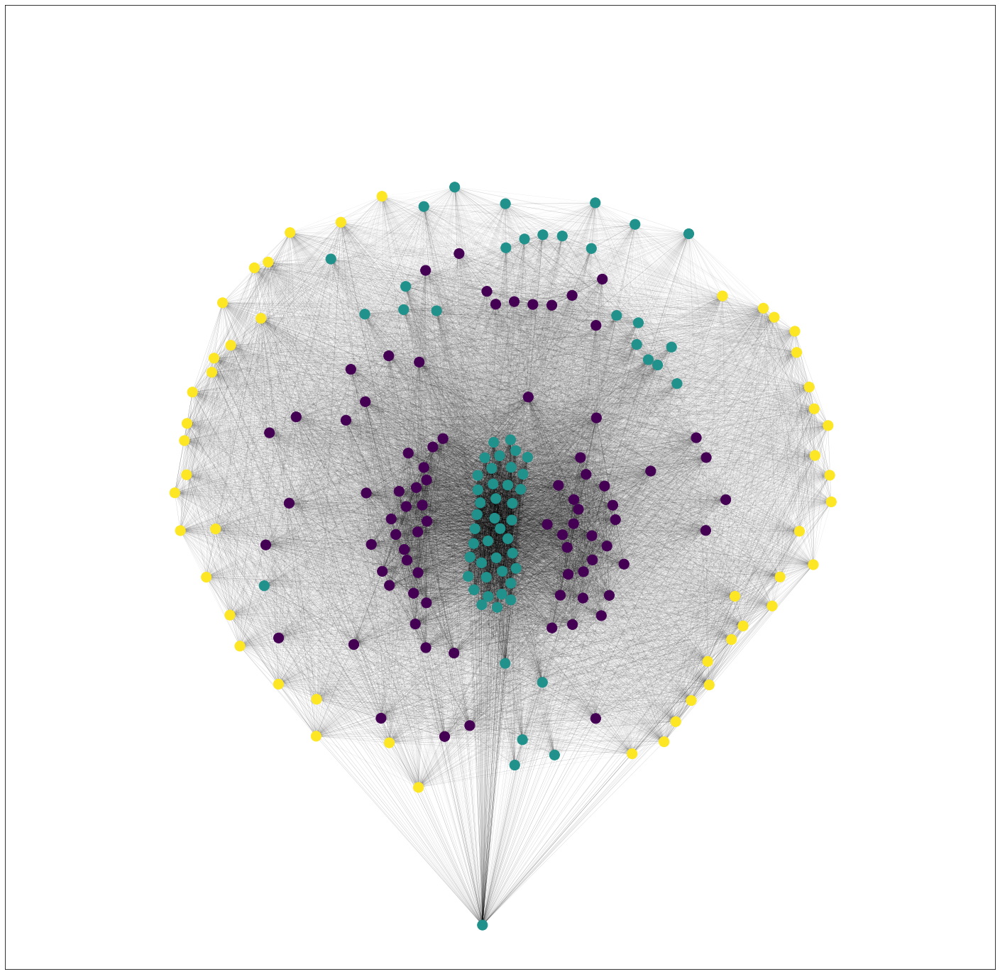

In [24]:
plt.figure(figsize=(25,25)) # define figure size
plt.ylim((-1.1,1.1)) # define y-axis
plt.xlim((-1.1,1.1)) # define x-axis
nx.draw_networkx_nodes(G, 
                       pos=coords_kamada,
                       node_size=200,
                       node_color = list(dict.values(comm))) # use community color for nodes
for edge in G.edges(data=True):
    edge_list = [edge[0:2]] # get edges in correct format
    edge_weight = ((edge[2]['weight']+0.3)**6)/50 # get weight that allows a readable plot
    nx.draw_networkx_edges(G, edgelist=edge_list, pos=coords_kamada, width=edge_weight)
#plt.savefig('Plots/Figure_network_community_kamada.png')

### Community Detection with Spring Layout

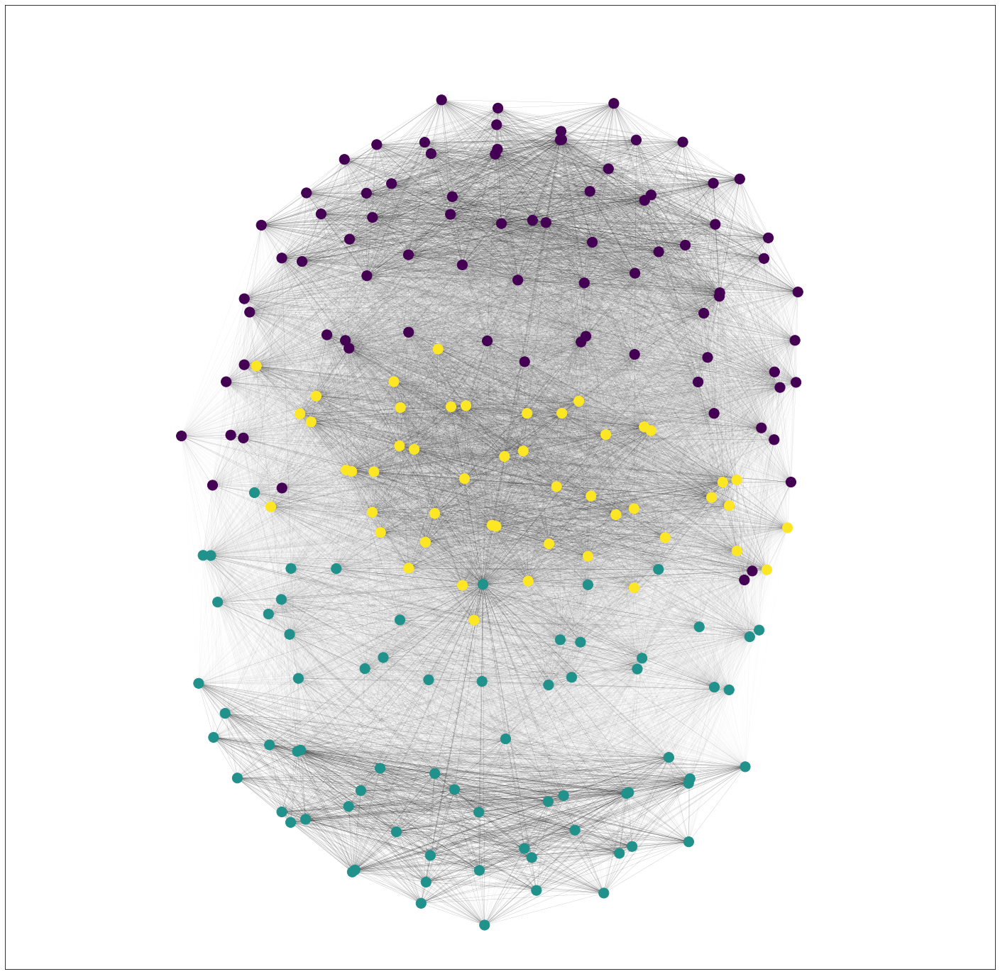

In [25]:
plt.figure(figsize=(25,25)) # define figure size
plt.ylim((-1.1,1.1)) # define y-axis
plt.xlim((-1.1,1.1)) # define x-axis
nx.draw_networkx_nodes(G, 
                       pos=coords_spring,
                       node_size=200,
                       node_color = list(dict.values(comm)))
for edge in G.edges(data=True):
    edge_list = [edge[0:2]] # get edges in correct format
    edge_weight = ((edge[2]['weight']+0.3)**6)/50 # get weight that allows a readable plot
    nx.draw_networkx_edges(G, edgelist=edge_list, pos=coords_spring, width=edge_weight)
plt.savefig('Plots/Figure_network_community_spring.png')

In this plot we can see, that the algorithm detected 3 communities (3 colors). This is interesting because we actually have 7 political parties.

### Findings with Spring and Kamada Kawai Community Detection
- After applying the community detection the Spring Layout seems to be a better representation of the parliament than Kamada Kawai, as it shows three groups left, middle, right.
- The community detection algorithm identifies three groups (left, middle, right).
- There is some missmatching between the layout algorithm and the community detection algorithm. Some nodes of the green group are more in the middle/right. Some nodes of the right group are more in the middle/left.

## **Step 4.3: Use the original political party colors in the network**
In the data we can see to which political party the parliamentarians belong to. We defined the following colour codes:
* SVP       = V : darkgreen
* CVP       = C : orange
* SP        = S : red
* Grüne     = G : limegreen
* FDP       = RL: blue
* Grün Lib. = GL: aquamarine
* BDP       = BD: yellow
* All other = AO: black

Also we import the names of the parliamenterians to display them in the plot. For this we need to change columns an rows of the data set. After this changement we can transpose the matrix with the command .T.

In [26]:
faction = pd.read_csv(r'party.csv', index_col=0)
faction

,3055,2670,2760,2758,2796,3056,2584,3057,3058,2762,...,3044,2715,3125,3100,2728,2759,2638,3127,3101,3102
CouncillorId,,,,,,,,,,,,,,,,,,,,,
CouncillorName,Addor Jean-Luc,Aebi Andreas,Aebischer Matthias,Aeschi Thomas,Amaudruz Céline,Ammann Thomas,Amstutz Adrian,Arnold Beat,Arslan Sibel,Badran Jacqueline,...,Walti Beat,Wasserfallen Christian,Wasserfallen Flavia,Wehrli Laurent,Weibel Thomas,Wermuth Cédric,Wobmann Walter,Wüthrich Adrian,Zanetti Claudio,Zuberbühler David
Fraktion,V,V,S,V,V,C,V,V,G,S,...,RL,RL,S,RL,GL,S,V,S,V,V


In [27]:
faction_T = faction.T # transpose the matrix (change columns and rows)
faction_T

CouncillorId,CouncillorName,Fraktion
3055,Addor Jean-Luc,V
2670,Aebi Andreas,V
2760,Aebischer Matthias,S
2758,Aeschi Thomas,V
2796,Amaudruz Céline,V
3056,Ammann Thomas,C
2584,Amstutz Adrian,V
3057,Arnold Beat,V
3058,Arslan Sibel,G
2762,Badran Jacqueline,S


In [28]:
dict_faction = {i: faction_T['Fraktion'][i] for i in range(0, len(faction_T))} # note the curly brackets
dict_faction # looks like a dictionary

{0: 'V',
 1: 'V',
 2: 'S',
 3: 'V',
 4: 'V',
 5: 'C',
 6: 'V',
 7: 'V',
 8: 'G',
 9: 'S',
 10: 'C',
 11: 'S',
 12: 'RL',
 13: 'GL',
 14: 'C',
 15: 'S',
 16: 'GL',
 17: 'RL',
 18: 'S',
 19: 'RL',
 20: 'RL',
 21: 'V',
 22: 'C',
 23: 'G',
 24: 'RL',
 25: 'V',
 26: 'V',
 27: 'V',
 28: 'C',
 29: 'V',
 30: 'RL',
 31: 'BD',
 32: 'C',
 33: 'S',
 34: 'RL',
 35: 'GL',
 36: 'V',
 37: 'V',
 38: 'S',
 39: 'C',
 40: 'V',
 41: 'G',
 42: 'RL',
 43: 'V',
 44: 'RL',
 45: 'V',
 46: 'C',
 47: 'V',
 48: 'RL',
 49: 'V',
 50: 'RL',
 51: 'C',
 52: 'S',
 53: 'RL',
 54: 'S',
 55: 'RL',
 56: 'GL',
 57: 'V',
 58: 'RL',
 59: 'V',
 60: 'S',
 61: 'S',
 62: 'S',
 63: 'V',
 64: 'RL',
 65: 'V',
 66: 'G',
 67: 'C',
 68: 'V',
 69: 'G',
 70: 'V',
 71: 'C',
 72: 'C',
 73: 'V',
 74: 'RL',
 75: 'G',
 76: 'S',
 77: 'V',
 78: 'GL',
 79: 'BD',
 80: 'V',
 81: 'C',
 82: 'C',
 83: 'BD',
 84: 'V',
 85: 'S',
 86: 'S',
 87: 'S',
 88: 'V',
 89: 'V',
 90: 'S',
 91: 'V',
 92: 'V',
 93: 'BD',
 94: 'RL',
 95: 'C',
 96: 'V',
 97: 'V',
 98:

In [29]:
nx.set_node_attributes(G, dict_faction, 'faction') # adding the political patys to the network

In [30]:
nx.get_node_attributes(G, 'faction') # accessing the political partys of the network

{0: 'V',
 1: 'V',
 2: 'S',
 3: 'V',
 4: 'V',
 5: 'C',
 6: 'V',
 7: 'V',
 8: 'G',
 9: 'S',
 10: 'C',
 11: 'S',
 12: 'RL',
 13: 'GL',
 14: 'C',
 15: 'S',
 16: 'GL',
 17: 'RL',
 18: 'S',
 19: 'RL',
 20: 'RL',
 21: 'V',
 22: 'C',
 23: 'G',
 24: 'RL',
 25: 'V',
 26: 'V',
 27: 'V',
 28: 'C',
 29: 'V',
 30: 'RL',
 31: 'BD',
 32: 'C',
 33: 'S',
 34: 'RL',
 35: 'GL',
 36: 'V',
 37: 'V',
 38: 'S',
 39: 'C',
 40: 'V',
 41: 'G',
 42: 'RL',
 43: 'V',
 44: 'RL',
 45: 'V',
 46: 'C',
 47: 'V',
 48: 'RL',
 49: 'V',
 50: 'RL',
 51: 'C',
 52: 'S',
 53: 'RL',
 54: 'S',
 55: 'RL',
 56: 'GL',
 57: 'V',
 58: 'RL',
 59: 'V',
 60: 'S',
 61: 'S',
 62: 'S',
 63: 'V',
 64: 'RL',
 65: 'V',
 66: 'G',
 67: 'C',
 68: 'V',
 69: 'G',
 70: 'V',
 71: 'C',
 72: 'C',
 73: 'V',
 74: 'RL',
 75: 'G',
 76: 'S',
 77: 'V',
 78: 'GL',
 79: 'BD',
 80: 'V',
 81: 'C',
 82: 'C',
 83: 'BD',
 84: 'V',
 85: 'S',
 86: 'S',
 87: 'S',
 88: 'V',
 89: 'V',
 90: 'S',
 91: 'V',
 92: 'V',
 93: 'BD',
 94: 'RL',
 95: 'C',
 96: 'V',
 97: 'V',
 98:

In [31]:
G.nodes() # accessing the nodes of the network

NodeView((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199))

In [32]:
G.nodes()[0]['faction'] # accessing the political party of the parliamentarian 0 (first node)

'V'

In [33]:
# Create a vector of colors in the same order as the faction dictionary
colors = []
for i in G.nodes():
    if G.nodes()[i]['faction'] == 'V': # SVP
        colors.append('darkgreen') 
    elif G.nodes()[i]['faction'] == 'C': # CVP
        colors.append('orange') 
    elif G.nodes()[i]['faction'] == 'S': # SP
        colors.append('red') # 
    elif G.nodes()[i]['faction'] == 'G': # Grüne
        colors.append('limegreen') 
    elif G.nodes()[i]['faction'] == 'RL': # Liberal Fraktion (FDP)
        colors.append('blue') 
    elif G.nodes()[i]['faction'] == 'GL': # Grün Liberal
        colors.append('aquamarine') 
    elif G.nodes()[i]['faction'] == 'BD': # BDP
        colors.append('yellow') 
    else:
        colors.append('black') 

Then we plot the network with the political party color code using spring layout.

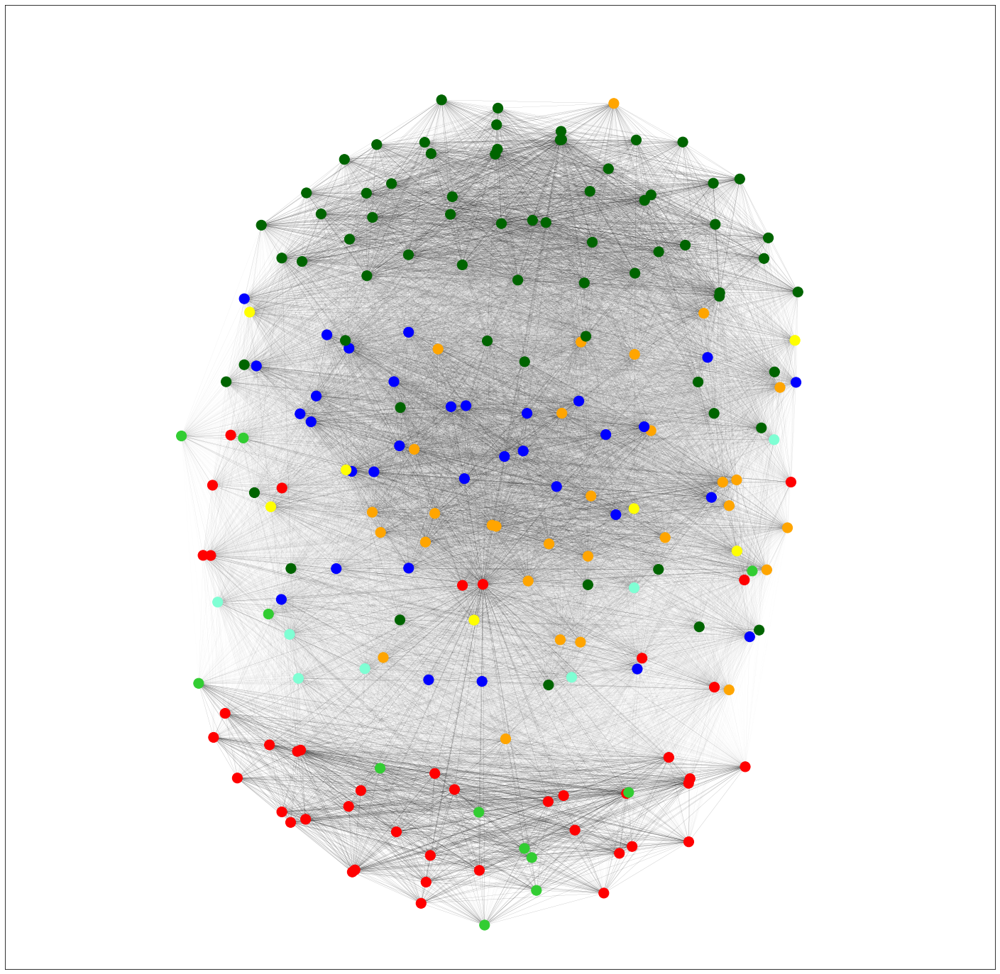

In [34]:
plt.figure(figsize=(25,25)) # define figure size
plt.ylim((-1.1,1.1))  # define y-axis
plt.xlim((-1.1,1.1))  # define x-axis
nx.draw_networkx_nodes(G, 
                       pos=coords_spring,
                       node_size=200,
                       node_color = colors) # use faction color for nodes
for edge in G.edges(data=True):
    edge_list = [edge[0:2]] # get edges in correct format
    edge_weight = ((edge[2]['weight']+0.3)**6)/50 # get weight that allows a readable plot
    nx.draw_networkx_edges(G, edgelist=edge_list, pos=coords_spring, width=edge_weight)
plt.savefig('Plots/Figure_network_faction_spring.png')

### Findings with Spring Layout
- Nice clustering of SVP and SP/Grüne
- Middle parties (CVP, FDP) are correctly detected in the middle, but have closer association to SVP
- «Bourgeois» group (conservative, christian, liberal, non-left)
- In general: Spring Layout locates the parties were we would expect them on the political spectrum, e.g. FDP a bit more to the right than CVP
- Some SVP members quite far on the left and some SP/Grüne members quite far on the right

Next we plot the network with the kamada kawai layout to see the differences.

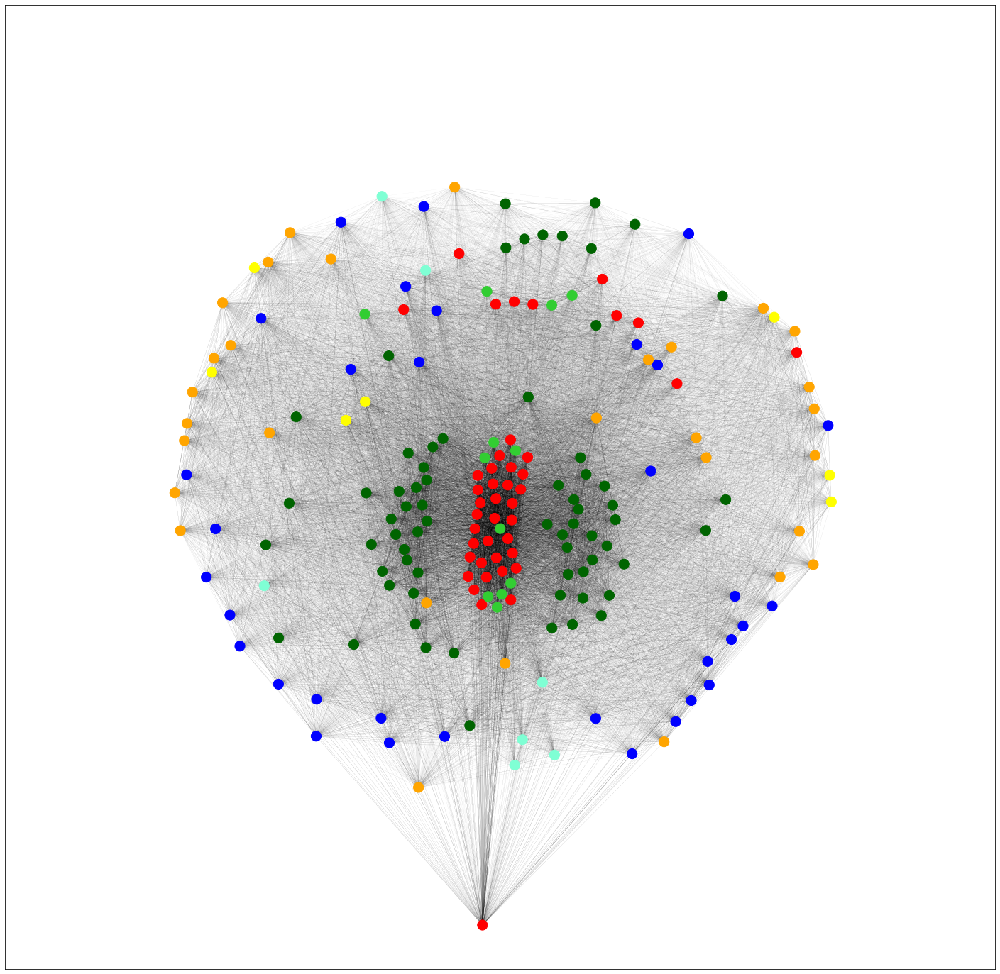

In [35]:
plt.figure(figsize=(25,25)) # define figure size
plt.ylim((-1.1,1.1)) # define y-axis
plt.xlim((-1.1,1.1)) # define x-axis
nx.draw_networkx_nodes(G, 
                       pos=coords_kamada,
                       node_size=200,
                       node_color = colors) # use faction color for nodes
for edge in G.edges(data=True):
    edge_list = [edge[0:2]] # get edges in correct format
    edge_weight = ((edge[2]['weight']+0.3)**6)/50 # get weight that allows a readable plot
    nx.draw_networkx_edges(G, edgelist=edge_list, pos=coords_kamada, width=edge_weight)
plt.savefig('Plots/Figure_network_faction_kamada.png')

### Findings with kamada kawai layout
- With this layout algorithm the two big parties (SP and SVP) are clearly clustered whereas the middle-parties are more spread around. 
- There is a nice cluster of the "Grünliberale" pary at the bottom (aquamarine color), which seems to be correctly detected by the layout algorithm. E.g. the BDP party is not as nicely clustered on this plot.
- The SP, Grüne and SVP parlementarian at the very top (not in their party clusters) might be the ones deviating more often from the party line.
* One SP Member is quite far from all the other parlamentarians on the bottom: Marina Carobbio Guscetti (SP)

# Interpretations

## Comparison Communities versus Factions

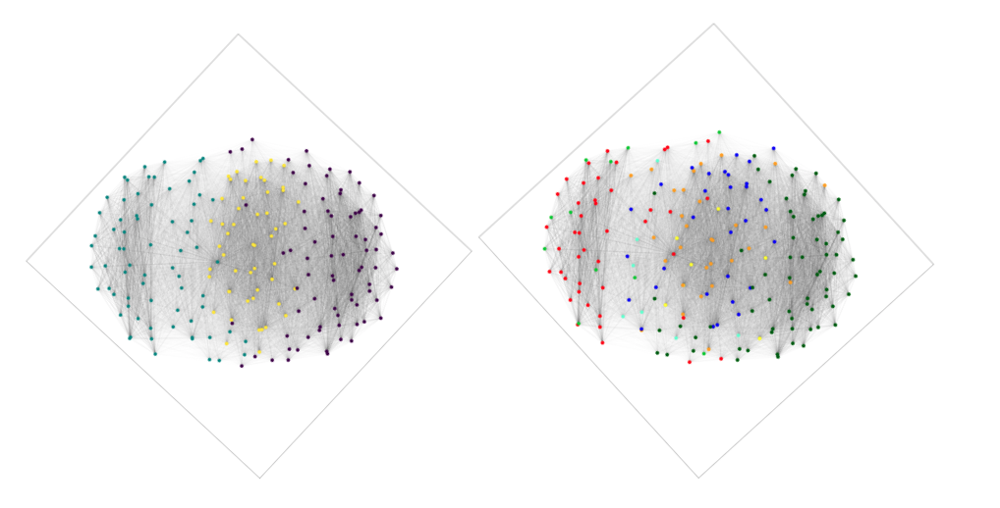

### Left Image: Community detection with Spring Layout
* The community detection algorithm identifies three groups(left, middle, right)
* There is some missmatch between the political parties and the community detection algorithm
* Some nodes of the green group are more in the middle/right. Some nodes of the right group are more in the middle/left.

### Right Image: Political parties with Spring Layout
* There is some nice clustering of SVP and of SP/Grüne. 
* The middle parties (CVP, FDP) are correctly detected in the middle. But they have closer association to SVP «bourgeois» group (conservative, christian, liberal, non-left)
* In general: Spring Layout locates the parties were we would expect them on the political spectrum, e.g. FDP a bit more to the right than CVP
* There are some SVP members quite far on the left and some SP/Grüne members quite far on the right those ones we want to identify


# Identify parliamentarians that deviate from party line

In [36]:
# read in data with names
name = pd.read_csv(r'name.csv', index_col=0)
name

,3055,2670,2760,2758,2796,3056,2584,3057,3058,2762,...,3044,2715,3125,3100,2728,2759,2638,3127,3101,3102
CouncillorId,,,,,,,,,,,,,,,,,,,,,
CouncillorName,Addor Jean-Luc,Aebi Andreas,Aebischer Matthias,Aeschi Thomas,Amaudruz Céline,Ammann Thomas,Amstutz Adrian,Arnold Beat,Arslan Sibel,Badran Jacqueline,...,Walti Beat,Wasserfallen Christian,Wasserfallen Flavia,Wehrli Laurent,Weibel Thomas,Wermuth Cédric,Wobmann Walter,Wüthrich Adrian,Zanetti Claudio,Zuberbühler David


In [37]:
name_T = name.T # transpose matrix
name_T

CouncillorId,CouncillorName
3055,Addor Jean-Luc
2670,Aebi Andreas
2760,Aebischer Matthias
2758,Aeschi Thomas
2796,Amaudruz Céline
3056,Ammann Thomas
2584,Amstutz Adrian
3057,Arnold Beat
3058,Arslan Sibel
2762,Badran Jacqueline


In [38]:
# create dictionary that can be used as node attribute
dict_name = {i: name_T['CouncillorName'][i] for i in range(0, len(name_T))} # note the curly brackets
dict_name # looks like a dictionary

{0: 'Addor Jean-Luc',
 1: 'Aebi Andreas',
 2: 'Aebischer Matthias',
 3: 'Aeschi Thomas',
 4: 'Amaudruz Céline',
 5: 'Ammann Thomas',
 6: 'Amstutz Adrian',
 7: 'Arnold Beat',
 8: 'Arslan Sibel',
 9: 'Badran Jacqueline',
 10: 'Barazzone Guillaume',
 11: 'Barrile Angelo',
 12: 'Bauer Philippe',
 13: 'Bäumle Martin',
 14: 'Béglé Claude',
 15: 'Bendahan Samuel',
 16: 'Bertschy Kathrin',
 17: 'Bigler Hans-Ulrich',
 18: 'Birrer-Heimo Prisca',
 19: 'Borloz Frédéric',
 20: 'Bourgeois Jacques',
 21: 'Brand Heinz',
 22: 'Bregy Philipp Matthias',
 23: 'Brélaz Daniel',
 24: 'Brunner Hansjörg',
 25: 'Büchel Roland Rino',
 26: 'Buffat Michaël',
 27: 'Bühler Manfred',
 28: 'Bulliard-Marbach Christine',
 29: 'Burgherr Thomas',
 30: 'Burkart Thierry',
 31: 'Campell Duri',
 32: 'Candinas Martin',
 33: 'Carobbio Guscetti Marina',
 34: 'Cattaneo Rocco',
 35: 'Chevalley Isabelle',
 36: 'Chiesa Marco',
 37: 'Clottu Raymond',
 38: 'Crottaz Brigitte',
 39: 'de Buman Dominique',
 40: 'de Courten Thomas',
 41: '

In [39]:
# add node attribute
nx.set_node_attributes(G, dict_name, 'name')

In [40]:
# check node attribue
nx.get_node_attributes(G, 'name')

{0: 'Addor Jean-Luc',
 1: 'Aebi Andreas',
 2: 'Aebischer Matthias',
 3: 'Aeschi Thomas',
 4: 'Amaudruz Céline',
 5: 'Ammann Thomas',
 6: 'Amstutz Adrian',
 7: 'Arnold Beat',
 8: 'Arslan Sibel',
 9: 'Badran Jacqueline',
 10: 'Barazzone Guillaume',
 11: 'Barrile Angelo',
 12: 'Bauer Philippe',
 13: 'Bäumle Martin',
 14: 'Béglé Claude',
 15: 'Bendahan Samuel',
 16: 'Bertschy Kathrin',
 17: 'Bigler Hans-Ulrich',
 18: 'Birrer-Heimo Prisca',
 19: 'Borloz Frédéric',
 20: 'Bourgeois Jacques',
 21: 'Brand Heinz',
 22: 'Bregy Philipp Matthias',
 23: 'Brélaz Daniel',
 24: 'Brunner Hansjörg',
 25: 'Büchel Roland Rino',
 26: 'Buffat Michaël',
 27: 'Bühler Manfred',
 28: 'Bulliard-Marbach Christine',
 29: 'Burgherr Thomas',
 30: 'Burkart Thierry',
 31: 'Campell Duri',
 32: 'Candinas Martin',
 33: 'Carobbio Guscetti Marina',
 34: 'Cattaneo Rocco',
 35: 'Chevalley Isabelle',
 36: 'Chiesa Marco',
 37: 'Clottu Raymond',
 38: 'Crottaz Brigitte',
 39: 'de Buman Dominique',
 40: 'de Courten Thomas',
 41: '

## Spring Layout Name detection

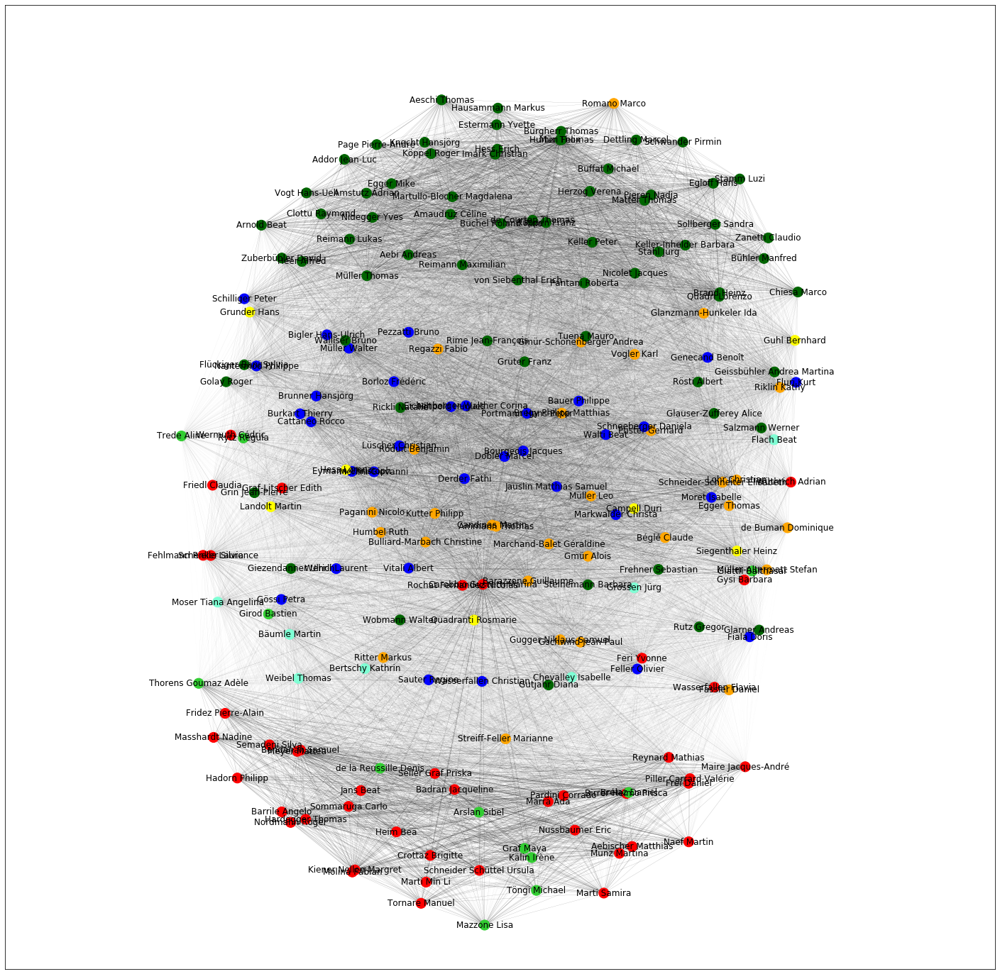

In [41]:
plt.figure(figsize=(25,25)) # define figure size
plt.ylim((-1.1,1.1)) # define y-axis
plt.xlim((-1.1,1.1)) # define x-axis
nx.draw_networkx_nodes(G, 
                       pos=coords_spring,
                       node_size=200,
                       node_color = colors) # use faction color for nodes
for edge in G.edges(data=True):
    edge_list = [edge[0:2]] # get edges in correct format
    edge_weight = ((edge[2]['weight']+0.3)**6)/50 # get weight that allows a readable plot
    nx.draw_networkx_edges(G, edgelist=edge_list, pos=coords_spring, width=edge_weight)

# create labels on the plot
nx.draw_networkx_labels(G,pos=coords_spring,labels=dict_name,font_size=12)

plt.savefig('Plots/Figure_network_identified_spring.png')

## Kamada Layout Name detection

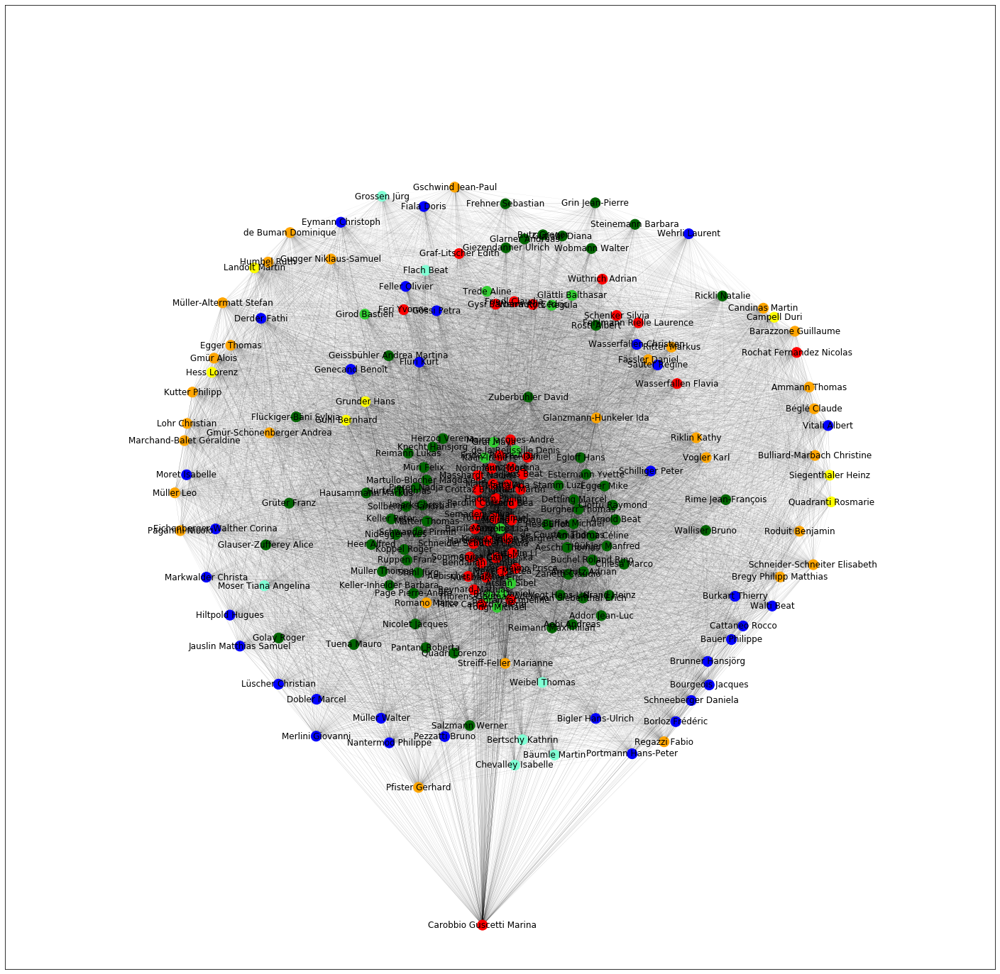

In [42]:
plt.figure(figsize=(25,25)) # define figure size
plt.ylim((-1.1,1.1)) # define axis
plt.xlim((-1.1,1.1)) # define axis
nx.draw_networkx_nodes(G, 
                       pos=coords_kamada,
                       node_size=200,
                       node_color = colors) # use faction color for nodes
for edge in G.edges(data=True):
    edge_list = [edge[0:2]] # get edges in correct format
    edge_weight = ((edge[2]['weight']+0.3)**6)/50 # get weight that allows a readable plot
    nx.draw_networkx_edges(G, edgelist=edge_list, pos=coords_kamada, width=edge_weight)

# create labels on the plot
nx.draw_networkx_labels(G,pos=coords_kamada,labels=dict_name,font_size=12)
plt.savefig('Plots/Figure_network_identified_kamada.png')

# Reflection

**Can we identify communities in the parliament by analyzing how each of the parliamentarian voted?**\
The Spring Layout allowed a representation from left wing to right wing (political spectrum) in a network plot similar to the seat allocation in the parliament. The community detection algorithm recognized three groups in the parliament (left, middle, right). 

**Which parliamentarian deviates most from the party line?**\
SVP: Rutz Gregor, Steinemann Barbara, Wobmann Walter, Gutjahr Diana, Giezendanner Ulrich, Jean-Pierre Grin-Hofmann, Frehner Sebastian, Glarner Andreas
SP/Grüne: Rytz Regula, Glättli Balthasar, Wüthrich Adrian, Friedli Claudia, Graf-Litscher Edith, Trede Aline 

**Caveats**

* Past deviation from the party line is not necessarily an indicator for future deviation
* Left wing and right wing might vote for the same thing for different reasons
* Only one year was investigated


# Learnings

* Focus on your question, otherwise you are loosing yourself 
* Before starting think in detail how you will proceed
* Data preparation is time consuming (e.g. creating adjacency matrix)
* Not easy to find the right layout for the network
* Interpretation is crucial but needs background information

# Outlook

**Technical**
* Apply threshold to exclude low interaction weights
* Work with Gephi

**Further Analysis**
* Create network per category (Economy, Education, internal affairs, external affairs, etc.)
* Analyse multiple years
* Investigate network dynamics over time

**Validation**
* Do plausibility check on the identified parliamentarians 
